In [1]:
import torch
import numpy as np
import torch.nn as nn
from torch.optim import Adam
import matplotlib.pyplot as plt
from torchvision.datasets import MNIST
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from mpl_toolkits.axes_grid1 import ImageGrid
from torchvision.utils import save_image, make_grid

In [2]:
# create a transofrm to apply to each datapoint
transform = transforms.Compose([transforms.ToTensor()])

# download the MNIST datasets
path = '~/datasets'
train_dataset = MNIST(path, transform=transform, download=True)
test_dataset  = MNIST(path, transform=transform, download=True)

# create train and test dataloaders
batch_size = 100
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

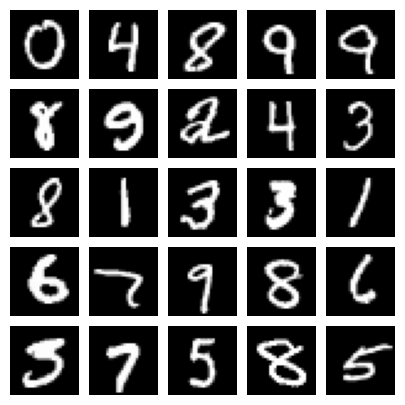

In [3]:
# get 25 sample training images for visualization
dataiter = iter(train_loader)
image = next(dataiter)

num_samples = 25
sample_images = [image[0][i,0] for i in range(num_samples)]

fig = plt.figure(figsize=(5, 5))
grid = ImageGrid(fig, 111, nrows_ncols=(5, 5), axes_pad=0.1)

for ax, im in zip(grid, sample_images):
    ax.imshow(im, cmap='gray')
    ax.axis('off')

plt.show()

In [4]:
class Encoder(nn.Module):

    def __init__(self, input_dim=784, hidden_dim=512, latent_dim=256):
        super(Encoder, self).__init__()

        self.linear1 = nn.Linear(input_dim, hidden_dim)
        self.linear2 = nn.Linear(hidden_dim, hidden_dim)
        self.mean = nn.Linear(hidden_dim, latent_dim)
        self.var = nn.Linear (hidden_dim, latent_dim)
        self.LeakyReLU = nn.LeakyReLU(0.2)
        self.training = True

    def forward(self, x):
        x = self.LeakyReLU(self.linear1(x))
        x = self.LeakyReLU(self.linear2(x))

        mean = self.mean(x)
        log_var = self.var(x)
        return mean, log_var

In [5]:
class Decoder(nn.Module):

    def __init__(self, output_dim=784, hidden_dim=512, latent_dim=256):
        super(Decoder, self).__init__()

        self.linear2 = nn.Linear(latent_dim, hidden_dim)
        self.linear1 = nn.Linear(hidden_dim, hidden_dim)
        self.output = nn.Linear(hidden_dim, output_dim)
        self.LeakyReLU = nn.LeakyReLU(0.2)

    def forward(self, x):
        x = self.LeakyReLU(self.linear2(x))
        x = self.LeakyReLU(self.linear1(x))

        x_hat = torch.sigmoid(self.output(x))
        return x_hat

In [6]:
class VAE(nn.Module):

    def __init__(self, input_dim=784, hidden_dim=400, latent_dim=200, device=device):
        super(VAE, self).__init__()

        # encoder
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, latent_dim),
            nn.LeakyReLU(0.2)
            )

        # latent mean and variance
        # self.mean_layer = nn.Linear(latent_dim, 2)
        # self.logvar_layer = nn.Linear(latent_dim, 2)

        # decoder
        self.decoder = nn.Sequential(
            nn.Linear(2, latent_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(latent_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, input_dim),
            nn.Sigmoid()
            )

    def encode(self, x):
        x = self.encoder(x)
        mean, logvar = self.mean_layer(x), self.logvar_layer(x)
        return mean, logvar

    def reparameterization(self, mean, var):
        epsilon = torch.randn_like(var).to(device)
        z = mean + var*epsilon
        return z

    def decode(self, x):
        return self.decoder(x)

    def forward(self, x):
        mean, logvar = self.encode(x)
        mean = torch.zeros_like(mean)
        logvar = torch.ones_like(logvar)
        z = self.reparameterization(mean, logvar)
        x_hat = self.decode(z)
        return x_hat, mean, log_var

    def forward(self, x):
        mean, log_var = self.encode(x)
        z = self.reparameterization(mean, torch.exp(0.5 * log_var))
        x_hat = self.decode(z)
        return x_hat, mean, log_var

In [7]:
model = VAE().to(device)
optimizer = Adam(model.parameters(), lr=1e-3)

In [8]:
def loss_function(x, x_hat, mean, log_var):
    reproduction_loss = nn.functional.binary_cross_entropy(x_hat, x, reduction='sum')
    KLD = - 0.5 * torch.sum(1+ log_var - mean.pow(2) - log_var.exp())

    return reproduction_loss + KLD

In [9]:
def train(model, optimizer, epochs, device, x_dim=784):
    model.train()
    for epoch in range(epochs):
        overall_loss = 0
        for batch_idx, (x, _) in enumerate(train_loader):
            x = x.view(batch_size, x_dim).to(device)

            optimizer.zero_grad()

            x_hat, mean, log_var = model(x)
            loss = loss_function(x, x_hat, mean, log_var)

            overall_loss += loss.item()

            loss.backward()
            optimizer.step()

        print("\tEpoch", epoch + 1, "\tAverage Loss: ", overall_loss/(batch_idx*batch_size))
    return overall_loss

In [10]:
train(model, optimizer, epochs=50, device=device)

	Epoch 1 	Average Loss:  180.03666522654945
	Epoch 2 	Average Loss:  162.30525579742277
	Epoch 3 	Average Loss:  157.69010453620618
	Epoch 4 	Average Loss:  155.14955301479029
	Epoch 5 	Average Loss:  153.33726619561247
	Epoch 6 	Average Loss:  152.08456026972036
	Epoch 7 	Average Loss:  150.93910421992382
	Epoch 8 	Average Loss:  149.96097816021495
	Epoch 9 	Average Loss:  149.2324086530937
	Epoch 10 	Average Loss:  148.46360420035998
	Epoch 11 	Average Loss:  147.92378387807804
	Epoch 12 	Average Loss:  147.42042632903798
	Epoch 13 	Average Loss:  146.9482256071317
	Epoch 14 	Average Loss:  146.48081238913815
	Epoch 15 	Average Loss:  146.04874506012627
	Epoch 16 	Average Loss:  145.68217113157345
	Epoch 17 	Average Loss:  145.37019883399415
	Epoch 18 	Average Loss:  145.10661031732576
	Epoch 19 	Average Loss:  144.83189474319178
	Epoch 20 	Average Loss:  144.51286522459307
	Epoch 21 	Average Loss:  144.27108442456176
	Epoch 22 	Average Loss:  144.0742879245357
	Epoch 23 	Average Los

8398098.4921875

In [11]:
def generate_digit(mean, var):
    z_sample = torch.tensor([[mean, var]], dtype=torch.float).to(device)
    x_decoded = model.decode(z_sample)
    digit = x_decoded.detach().cpu().reshape(28, 28) # reshape vector to 2d array
    plt.title(f'[{mean},{var}]')
    plt.imshow(digit, cmap='gray')
    plt.axis('off')
    plt.show()

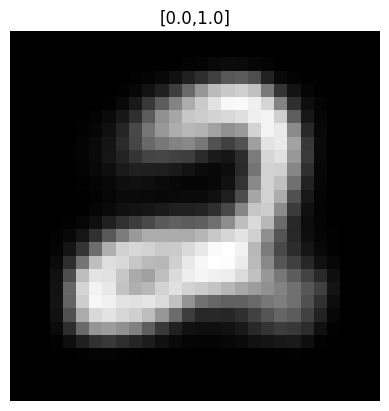

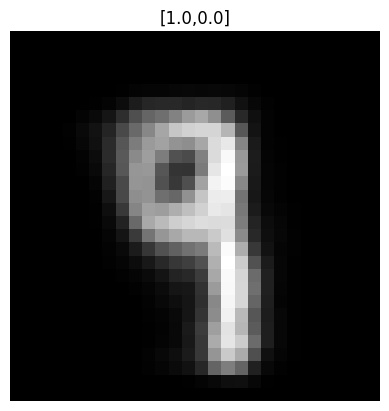

(None, None)

In [12]:
#img1: mean0, var1 / img2: mean1, var0
generate_digit(0.0, 1.0), generate_digit(1.0, 0.0)

In [13]:
def plot_latent_space(model, scale=5.0, n=25, digit_size=28, figsize=15):
    # display a n*n 2D manifold of digits
    figure = np.zeros((digit_size * n, digit_size * n))

    # construct a grid
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = torch.tensor([[xi, yi]], dtype=torch.float).to(device)
            x_decoded = model.decode(z_sample)
            digit = x_decoded[0].detach().cpu().reshape(digit_size, digit_size)
            figure[i * digit_size : (i + 1) * digit_size, j * digit_size : (j + 1) * digit_size,] = digit

    plt.figure(figsize=(figsize, figsize))
    plt.title('VAE Latent Space Visualization')
    start_range = digit_size // 2
    end_range = n * digit_size + start_range
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("mean, z [0]")
    plt.ylabel("var, z [1]")
    plt.imshow(figure, cmap="Greys_r")
    plt.show()

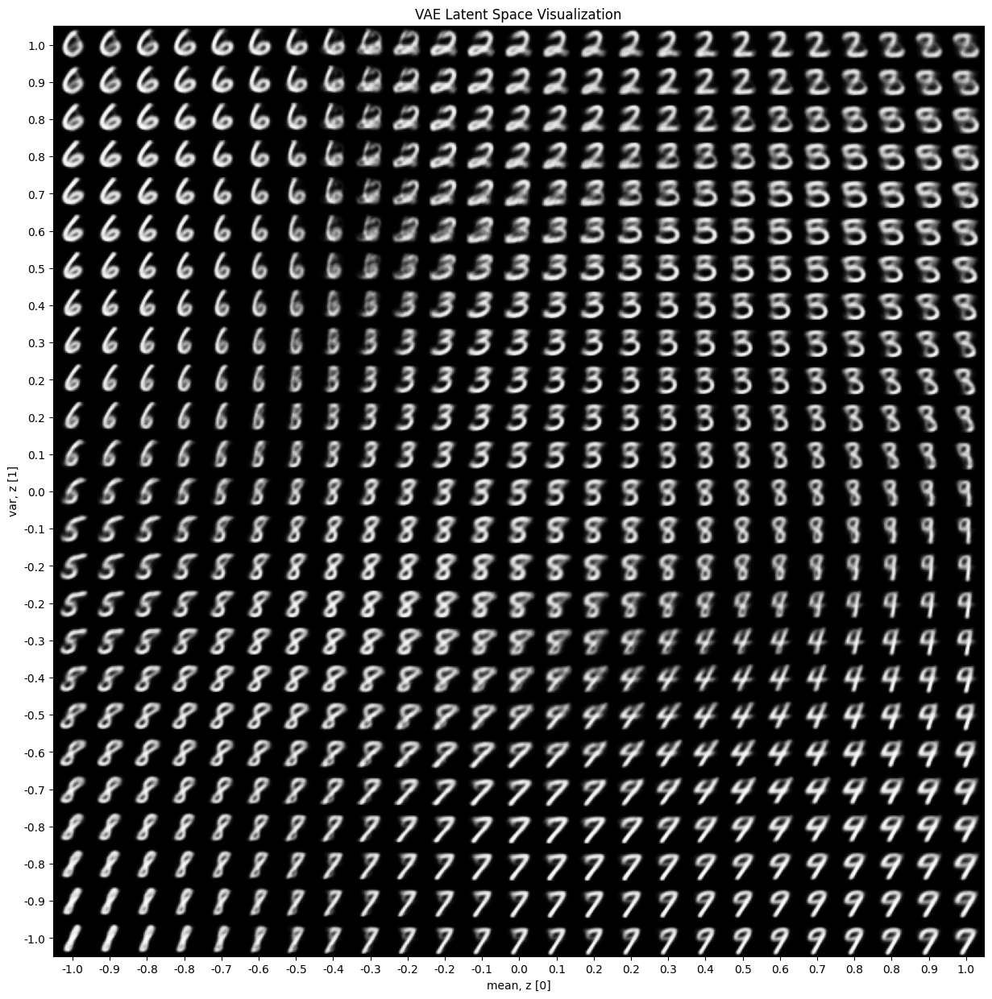

In [14]:
plot_latent_space(model, scale=1.0)

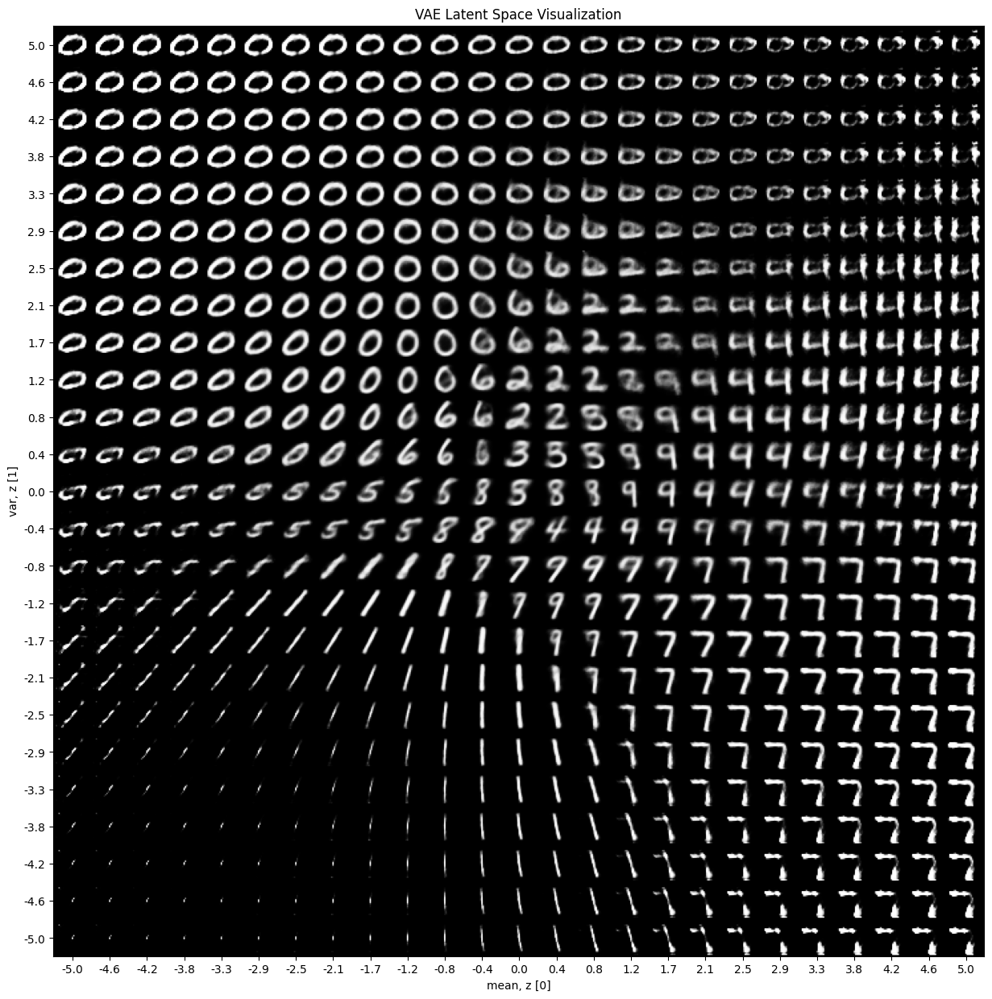

In [15]:
plot_latent_space(model, scale=5.0)

In [21]:
torch.log(torch.ones(1)*2)

tensor([0.6931])

In [1]:
import diffusers
import matplotlib.pyplot as plt
import torch

In [2]:
scheduler = diffusers.DDIMScheduler.from_pretrained("Lykon/Dreamshaper", subfolder="scheduler")

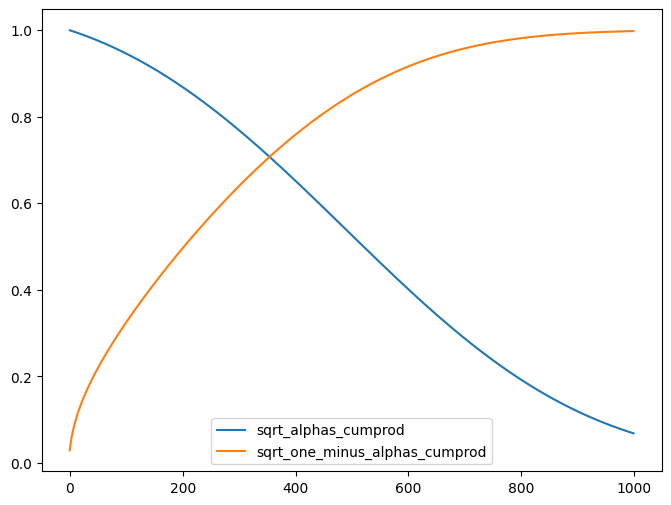

In [3]:
sqrt_alpha_prod = scheduler.alphas_cumprod ** 0.5
sqrt_one_minus_alpha_prod = (1 - scheduler.alphas_cumprod) ** 0.5

plt.figure(figsize=(8, 6))
plt.plot(sqrt_alpha_prod, label="sqrt_alphas_cumprod")
plt.plot(sqrt_one_minus_alpha_prod, label="sqrt_one_minus_alphas_cumprod")
plt.legend()

t = 500
x0, eps = torch.ones(1), torch.ones(1)
xt = sqrt_alpha_prod[t] * x0 + sqrt_one_minus_alpha_prod[t] * eps

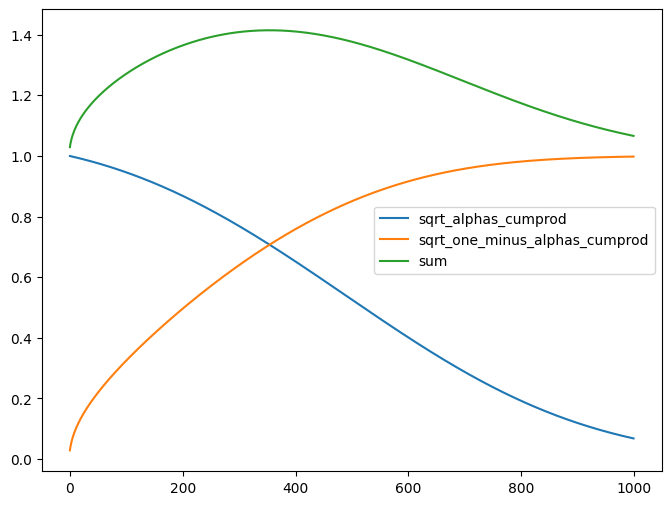

In [6]:
sqrt_alpha_prod = scheduler.alphas_cumprod ** 0.5
sqrt_one_minus_alpha_prod = (1 - scheduler.alphas_cumprod) ** 0.5

plt.figure(figsize=(8, 6))
plt.plot(sqrt_alpha_prod, label="sqrt_alphas_cumprod")
plt.plot(sqrt_one_minus_alpha_prod, label="sqrt_one_minus_alphas_cumprod")
plt.plot(sqrt_alpha_prod + sqrt_one_minus_alpha_prod, label="sum")
plt.legend()

t = 500
x0, eps = torch.ones(1), torch.ones(1)
xt = sqrt_alpha_prod[t] * x0 + sqrt_one_minus_alpha_prod[t] * eps

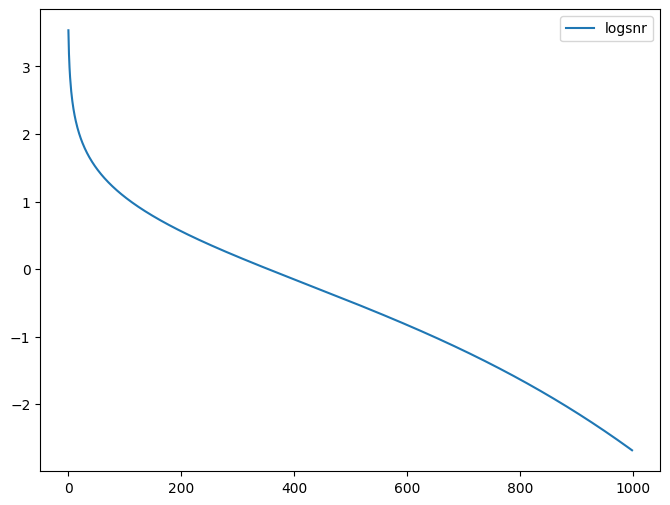

In [5]:
sqrt_alpha_prod = scheduler.alphas_cumprod ** 0.5
sqrt_one_minus_alpha_prod = (1 - scheduler.alphas_cumprod) ** 0.5
ratio = sqrt_alpha_prod / sqrt_one_minus_alpha_prod
log_ratio = torch.log(ratio)

plt.figure(figsize=(8, 6))
plt.plot(log_ratio, label="logsnr")
plt.legend()

In [9]:
print(log_ratio[0])
print(log_ratio[-1])

tensor(3.5347)
tensor(-2.6820)


In [10]:
from PIL import Image
import numpy as np
img_path = "/home/ubuntu/seq_diffusion/tom.png"
img = Image.open(img_path).convert("RGB")

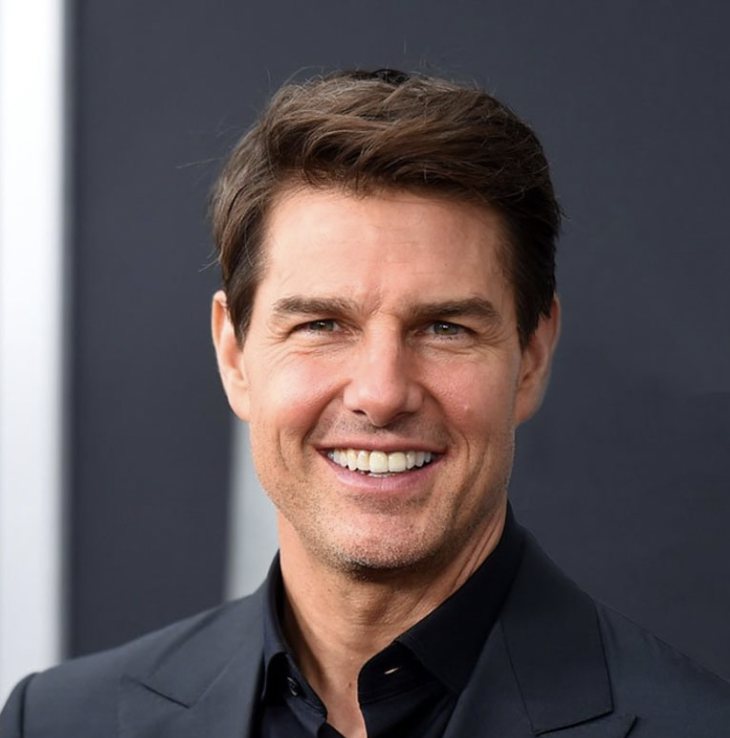

In [11]:
img

In [13]:
np_img = (np.array(img) / 255.0) #* 2 - 1
noise = np.random.randn(*np_img.shape)

In [14]:
ts = torch.linspace(0,999,16).long().tolist()
noised_imgs = []
for t in ts:
    sqrt_alpha_prod = scheduler.alphas_cumprod[t] ** 0.5
    sqrt_one_minus_alpha_prod = (1 - scheduler.alphas_cumprod[t]) ** 0.5
    x = sqrt_alpha_prod * np_img + sqrt_one_minus_alpha_prod * noise
    # x = x / 2 + 0.5
    x = np.clip(x, 0, 1)
    noised_imgs.append(x)


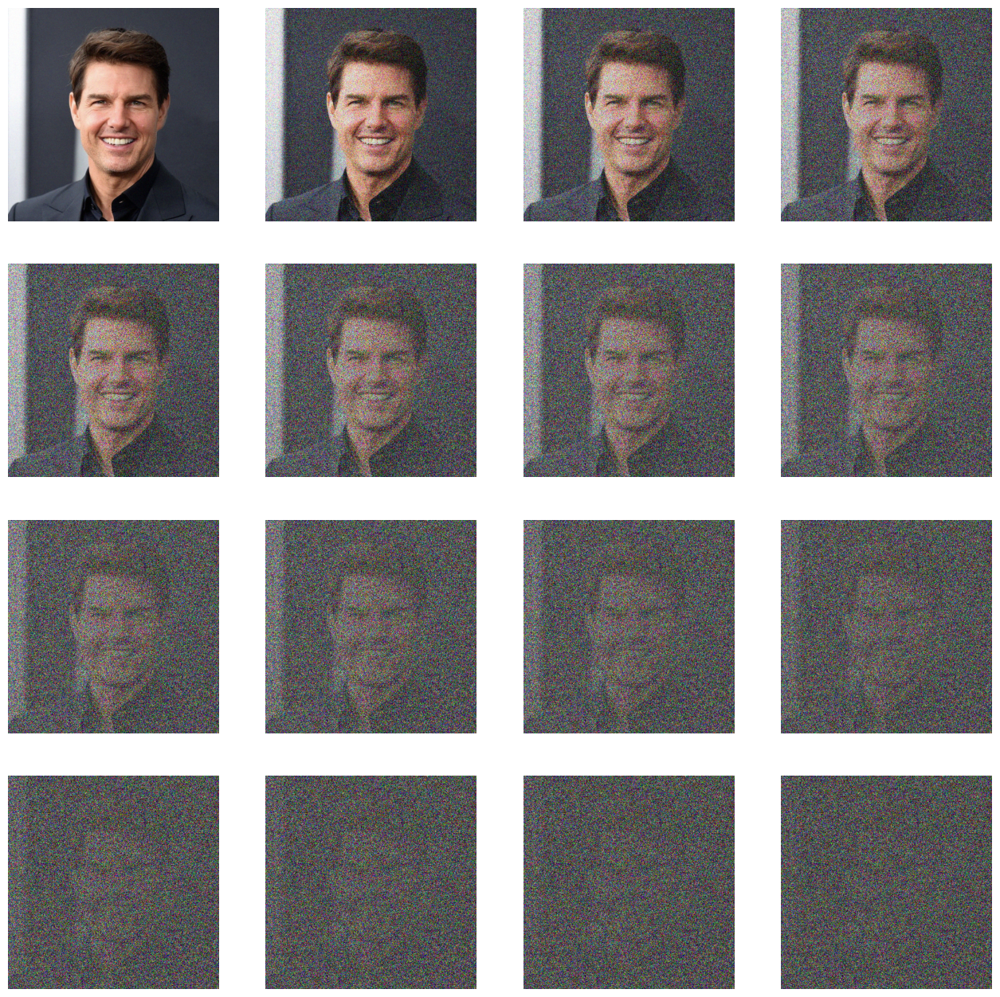

In [15]:
plt.figure(figsize=(16, 16))
for i, x in enumerate(noised_imgs):
    plt.subplot(4, 4, i+1)
    plt.imshow(x)
    plt.axis('off')

In [24]:
ts = torch.linspace(0,999,16).long().tolist()
residuals = []
for t in ts:
    sqrt_alpha_prod = scheduler.alphas_cumprod[t] ** 0.5
    sqrt_one_minus_alpha_prod = (1 - scheduler.alphas_cumprod[t]) ** 0.5
    x = sqrt_alpha_prod * np_img + sqrt_one_minus_alpha_prod * noise
    residual = x.numpy() - noise
    residual = np.clip(residual, 0, 1)
    residuals.append(residual)

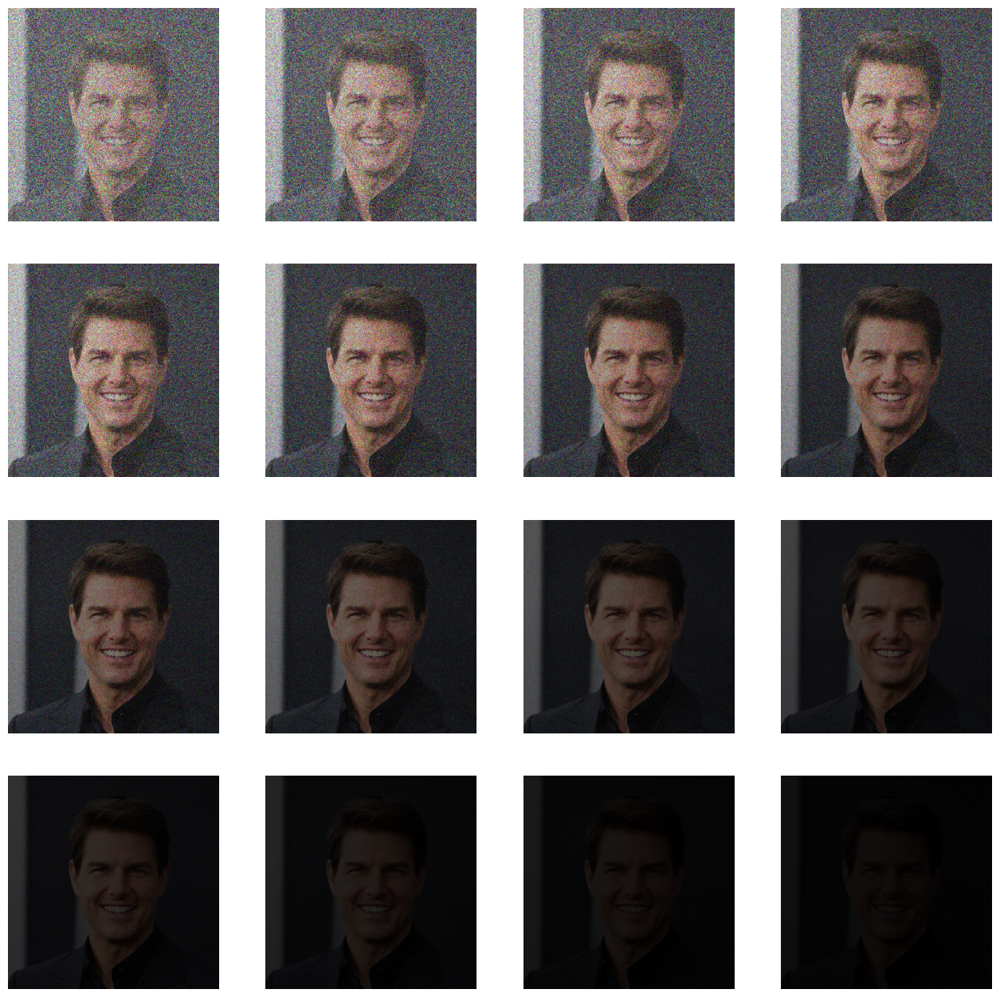

In [25]:
plt.figure(figsize=(16, 16))
for i, x in enumerate(residuals):
    plt.subplot(4, 4, i+1)
    plt.imshow(x)
    plt.axis('off')

In [33]:
ts = torch.linspace(0,999,16).long().tolist()
residuals = []
for t in ts:
    sqrt_alpha_prod = scheduler.alphas_cumprod[t] ** 0.5
    sqrt_one_minus_alpha_prod = (1 - scheduler.alphas_cumprod[t]) ** 0.5
    x = sqrt_alpha_prod * np_img + sqrt_one_minus_alpha_prod * noise
    residual = x.numpy() - noise
    fac = (sqrt_one_minus_alpha_prod.item()/sqrt_alpha_prod.item())
    if fac > 1.0:
        residual = residual * fac
    residual = np.clip(residual, 0, 1)
    residuals.append(residual)

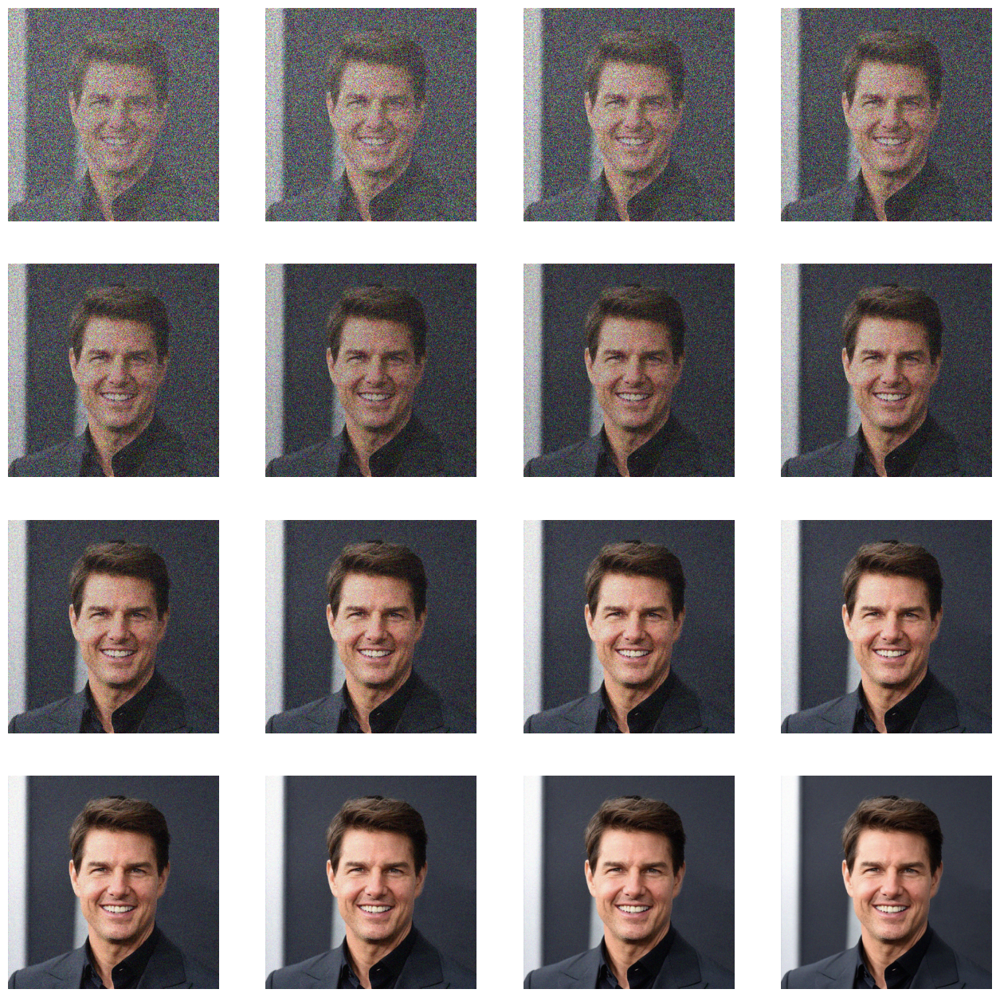

In [34]:
plt.figure(figsize=(16, 16))
for i, x in enumerate(residuals):
    plt.subplot(4, 4, i+1)
    plt.imshow(x)
    plt.axis('off')